<div style="text-align: center;">
    <h2>UNIVERSIDAD DE MONTERREY</h2>



<img src="./Logo_UDEM.jpg" width="20%">

### Vicerrectoría de Educación Superior
### División de Ingeniería y Tecnologías
### Inteligencia Artificial II
### Dr. Andrés Hernández Gutiérrez
### Clasificacion Binaria de Enfermedades del Corazon Usando un Modelo "PERCEPTRÓN"


Joel Enrique Díaz Villanueva 594847 IMT

José Miguel González Zaragoza 631145 IRSI

David Sebastián Izaguirre Garza 583840 IRSI


</div>

In [587]:
import os
from datetime import datetime
import pandas as pd # Proporciona estructuras de datos y herramientas para el análisis eficiente de datos tabulares, series temporales y matrices etiquetadas o no etiquetadas.
import plotly.express as px # Permite crear diversas figuras a la vez.
import seaborn as sns
import matplotlib.pyplot as plt # Está diseñada para crear gráficos y visualizaciones interactivas de datos, por ejemplo, para trazar las curvas de aprendizaje y evaluar el proceso de entrenamiento.
import numpy as np # Se utiliza para crear arreglos multidimensionales y realizar operaciones matemáticas, lógicas y de álgebra lineal, además de la generación de números aleatorios.
import tensorflow as tf #  Librería desarrollada por Google, es de las más utilizadas para diseñar, entrenar, validar y probar el desarrollo de una red neuronal.
from sklearn.model_selection import train_test_split # Esta biblioteca proporciona el método train_test_split para dividir el conjunto de datos inicial en los conjuntos de entrenamiento y validación.
from sklearn.preprocessing import StandardScaler # Estándariza las características eliminando la media y escalando a una varianza unitaria. (z = (x - u) / s)
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay, classification_report # Se utiliza para gráficar en una matriz una comparación entre los valores reales y predichos

En la siguiente sección se leen los datos del archivo CSV y se guardan en la variable data para luego mostrar los datos en la terminal.

In [2]:
data = pd.read_csv('Skyserver_SQL2_27_2018 6_51_39 PM.csv')
df = data
df

,objid,ra,dec,u,g,r,i,z,run,rerun,camcol,field,specobjid,class,redshift,plate,mjd,fiberid
0,1.237650e+18,183.531326,0.089693,19.47406,17.04240,15.94699,15.50342,15.22531,752,301,4,267,3.722360e+18,STAR,-0.000009,3306,54922,491
1,1.237650e+18,183.598370,0.135285,18.66280,17.21449,16.67637,16.48922,16.39150,752,301,4,267,3.638140e+17,STAR,-0.000055,323,51615,541
2,1.237650e+18,183.680207,0.126185,19.38298,18.19169,17.47428,17.08732,16.80125,752,301,4,268,3.232740e+17,GALAXY,0.123111,287,52023,513
3,1.237650e+18,183.870529,0.049911,17.76536,16.60272,16.16116,15.98233,15.90438,752,301,4,269,3.722370e+18,STAR,-0.000111,3306,54922,510
4,1.237650e+18,183.883288,0.102557,17.55025,16.26342,16.43869,16.55492,16.61326,752,301,4,269,3.722370e+18,STAR,0.000590,3306,54922,512
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,1.237650e+18,131.316413,51.539547,18.81777,17.47053,16.91508,16.68305,16.50570,1345,301,3,161,5.033450e+17,GALAXY,0.027583,447,51877,246
9996,1.237650e+18,131.306083,51.671341,18.27255,17.43849,17.07692,16.71661,16.69897,1345,301,3,162,5.033400e+17,GALAXY,0.117772,447,51877,228
9997,1.237650e+18,131.552562,51.666986,18.75818,17.77784,17.51872,17.43302,17.42048,1345,301,3,162,8.222620e+18,STAR,-0.000402,7303,57013,622
9998,1.237650e+18,131.477151,51.753068,18.88287,17.91068,17.53152,17.36284,17.13988,1345,301,3,163,5.033400e+17,GALAXY,0.014019,447,51877,229


En la base datos se puede observar los  siguientes valores:
1. **objid**: Identificador del objeto.
2. **ra**: J2000  Asensión recta.
3. **dec**: J2000 Declinación.
4. **u**: Mejor ajuste de magnitud DeV/Exp.
5. **g**: Mejor ajuste de magnitud DeV/Exp.
6. **r**: Mejor ajuste de magnitud DeV/Exp.
7. **i**: Mejor ajuste de magnitud DeV/Exp.
8. **z**: Mejor ajuste de magnitud DeV/Exp.
9. **run**: Número de ejecución.
10. **rerun**: Número de repetición.
11. **camcol**: Columna de cámara.
12. **field**: Número de campo.
13. **specobjid**: Identificador del objeto.
14. **class**: Clase de objeto. Es un  tipo texto.
15. **redshift**: Desplazamiento final al espectro rojo.
16. **plate**: Matrícula.
17. **mjd**: MJD de observación.
18. **fiberid**: Identificación de fibra.

- value_counts(): nos permite saber los tipos de datos que estan presentes en la columna 'class', así como saber el número de veces que se repite.

In [3]:
df['class'].value_counts()

class
GALAXY    4998
STAR      4152
QSO        850
Name: count, dtype: int64

La función 'replace' cambiará los tipos de clases presentes en la columna 'class' con valores númericos (0, 1, 2)  para que sea más fácil de ejecutar. Se guardará el cambio hecho y se  mostrará para ver el cambio.

In [4]:
df['class'] = df['class'].replace({'GALAXY': 0, 'STAR': 1, 'QSO': 2})
df

C:\Users\USER\AppData\Local\Temp\ipykernel_9892\3166445850.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df['class'] = df['class'].replace({'GALAXY': 0, 'STAR': 1, 'QSO': 2})


,objid,ra,dec,u,g,r,i,z,run,rerun,camcol,field,specobjid,class,redshift,plate,mjd,fiberid
0,1.237650e+18,183.531326,0.089693,19.47406,17.04240,15.94699,15.50342,15.22531,752,301,4,267,3.722360e+18,1,-0.000009,3306,54922,491
1,1.237650e+18,183.598370,0.135285,18.66280,17.21449,16.67637,16.48922,16.39150,752,301,4,267,3.638140e+17,1,-0.000055,323,51615,541
2,1.237650e+18,183.680207,0.126185,19.38298,18.19169,17.47428,17.08732,16.80125,752,301,4,268,3.232740e+17,0,0.123111,287,52023,513
3,1.237650e+18,183.870529,0.049911,17.76536,16.60272,16.16116,15.98233,15.90438,752,301,4,269,3.722370e+18,1,-0.000111,3306,54922,510
4,1.237650e+18,183.883288,0.102557,17.55025,16.26342,16.43869,16.55492,16.61326,752,301,4,269,3.722370e+18,1,0.000590,3306,54922,512
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,1.237650e+18,131.316413,51.539547,18.81777,17.47053,16.91508,16.68305,16.50570,1345,301,3,161,5.033450e+17,0,0.027583,447,51877,246
9996,1.237650e+18,131.306083,51.671341,18.27255,17.43849,17.07692,16.71661,16.69897,1345,301,3,162,5.033400e+17,0,0.117772,447,51877,228
9997,1.237650e+18,131.552562,51.666986,18.75818,17.77784,17.51872,17.43302,17.42048,1345,301,3,162,8.222620e+18,1,-0.000402,7303,57013,622
9998,1.237650e+18,131.477151,51.753068,18.88287,17.91068,17.53152,17.36284,17.13988,1345,301,3,163,5.033400e+17,0,0.014019,447,51877,229


En la siguiente sección se convertirán los valores en formato numérico y se eliminan filas con valores que contengan NaN para facilitar la comprensión del programa.

- **apply(pd.to_numeric,errors = 'coerce')**: Convertirá los valores a formato númerico mediante la función 'pd.to_nummeric', 'errors = 'coerce' hará que los valores que generen error los reemplace con un NaN.
- **df[df.columns]**: Permitirá que el cambio se aplique en todas las columnas de la base de datos (df).
- **df.dropna()**: Esta función eliminará todas las filas que posean un NaN en sus datos. 

\
Con esto podemos limpiar la base de datos y solo dejar valores necesarios y evitar que generen errores por falta de datos en las columnas.

\
Ahora realizaremos un resumen estadístico con los datos ya filtrados.
- **df.describe().T**: Esta función tiene el propósito de hacer un resumen estadístico de los datos presenten en cada columna numérica de la base de datos. Se mostrará el *conteo*, *la media*, *la desviación estándar*, *el valor mínimo*, *los cuartiles* y *el  valor máximo*. '.T' permitirá  que se muestren los datos con una transposición.

In [5]:
df[df.columns] = df[df.columns].apply(pd.to_numeric, errors='coerce') # Se convierte todo el dataframe a valores numéricos para garantizar que no haya problemas con los cálculos posteriores.
df = df.dropna() # Se elimina cualquier fila que contenga valores NaN.
df.describe().T

,count,mean,std,min,25%,50%,75%,max
objid,10000.0,1.237650e+18,0.000000e+00,1.237650e+18,1.237650e+18,1.237650e+18,1.237650e+18,1.237650e+18
ra,10000.0,1.755300e+02,4.778344e+01,8.235100e+00,1.573709e+02,1.803945e+02,2.015473e+02,2.608844e+02
dec,10000.0,1.483615e+01,2.521221e+01,-5.382632e+00,-5.390350e-01,4.041660e-01,3.564940e+01,6.854227e+01
u,10000.0,1.861936e+01,8.286560e-01,1.298897e+01,1.817803e+01,1.885309e+01,1.925923e+01,1.959990e+01
g,10000.0,1.737193e+01,9.454572e-01,1.279955e+01,1.681510e+01,1.749513e+01,1.801015e+01,1.991897e+01
r,10000.0,1.684096e+01,1.067764e+00,1.243160e+01,1.617333e+01,1.685877e+01,1.751267e+01,2.480204e+01
i,10000.0,1.658358e+01,1.141805e+00,1.194721e+01,1.585370e+01,1.655499e+01,1.725855e+01,2.817963e+01
z,10000.0,1.642283e+01,1.203188e+00,1.161041e+01,1.561829e+01,1.638994e+01,1.714145e+01,2.283306e+01
run,10000.0,9.810348e+02,2.733050e+02,3.080000e+02,7.520000e+02,7.560000e+02,1.331000e+03,1.412000e+03
rerun,10000.0,3.010000e+02,0.000000e+00,3.010000e+02,3.010000e+02,3.010000e+02,3.010000e+02,3.010000e+02


- **df['objid'].value_counts()**: La siguiente función permite saber el número de veces que se repiten los datos presentes en la columna *objid*

In [6]:
df['objid'].value_counts()

objid
1.237650e+18    10000
Name: count, dtype: int64

Ahora se eliminará la columna *objid* debido a que posee el mismo valor.

- **df.drop('objid',axis =1)**: Esta función permitirá que se elimine la columna *objid* de la base de datos. *axis* se refiere a si se elimina una columna (1) o una fila (0).
- **df.describe().T**: Con los cambios hechos en la base de datos, ahora se hará el análisis estadístico y se realizará una transposición de la base de datos con  *.T*.

In [7]:
df = df.drop('objid', axis=1)
df.describe().T

,count,mean,std,min,25%,50%,75%,max
ra,10000.0,1.755300e+02,4.778344e+01,8.235100e+00,1.573709e+02,1.803945e+02,2.015473e+02,2.608844e+02
dec,10000.0,1.483615e+01,2.521221e+01,-5.382632e+00,-5.390350e-01,4.041660e-01,3.564940e+01,6.854227e+01
u,10000.0,1.861936e+01,8.286560e-01,1.298897e+01,1.817803e+01,1.885309e+01,1.925923e+01,1.959990e+01
g,10000.0,1.737193e+01,9.454572e-01,1.279955e+01,1.681510e+01,1.749513e+01,1.801015e+01,1.991897e+01
r,10000.0,1.684096e+01,1.067764e+00,1.243160e+01,1.617333e+01,1.685877e+01,1.751267e+01,2.480204e+01
i,10000.0,1.658358e+01,1.141805e+00,1.194721e+01,1.585370e+01,1.655499e+01,1.725855e+01,2.817963e+01
z,10000.0,1.642283e+01,1.203188e+00,1.161041e+01,1.561829e+01,1.638994e+01,1.714145e+01,2.283306e+01
run,10000.0,9.810348e+02,2.733050e+02,3.080000e+02,7.520000e+02,7.560000e+02,1.331000e+03,1.412000e+03
rerun,10000.0,3.010000e+02,0.000000e+00,3.010000e+02,3.010000e+02,3.010000e+02,3.010000e+02,3.010000e+02
camcol,10000.0,3.648700e+00,1.666183e+00,1.000000e+00,2.000000e+00,4.000000e+00,5.000000e+00,6.000000e+00


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   ra         10000 non-null  float64
 1   dec        10000 non-null  float64
 2   u          10000 non-null  float64
 3   g          10000 non-null  float64
 4   r          10000 non-null  float64
 5   i          10000 non-null  float64
 6   z          10000 non-null  float64
 7   run        10000 non-null  int64  
 8   rerun      10000 non-null  int64  
 9   camcol     10000 non-null  int64  
 10  field      10000 non-null  int64  
 11  specobjid  10000 non-null  float64
 12  class      10000 non-null  int64  
 13  redshift   10000 non-null  float64
 14  plate      10000 non-null  int64  
 15  mjd        10000 non-null  int64  
 16  fiberid    10000 non-null  int64  
dtypes: float64(9), int64(8)
memory usage: 1.3 MB


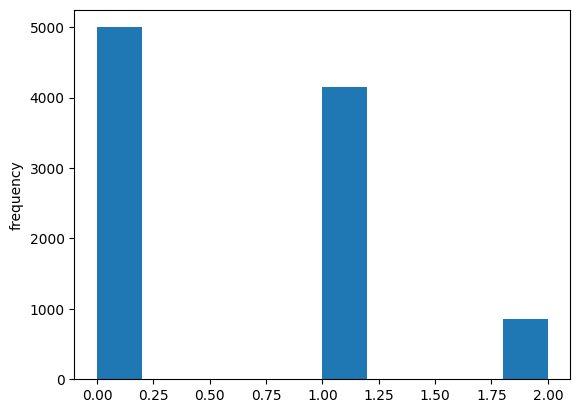

In [9]:
plt.hist(df['class']); # Se crea un histograma de la columna occupancy del dataframe.
plt.ylabel('frequency'); # Se etiqueta el eje Y para mostrar que representa la frecuencia de las clases.

In [10]:
# Scatter plot matrix
features = df.drop(["class"], axis=1).columns # Se elimina la columna Heart Disease.
fig = px.scatter_matrix(data_frame=df, # Se crea una matriz de gráficos de dispersión con los datos del DataFrame.
                        dimensions=features, # Se especifican las columnas a incluir en el gráfico, sin Heart Disease.
                        color=df['class']) # Se utiliza la columna 'Occupancy' para colorear los puntos en función de la ocupación.
fig.update_traces(marker = dict(size=4), diagonal_visible=False, showupperhalf=False) # Se actualiza el tamaño de los marcadores, se ocultan las diagonales y se muestra solo la mitad inferior de la matriz.
fig.update_layout(width=900, height=600, title="Galaxy/Star/Quasar Classification", font_size=9) # Se ajustan las dimensiones del gráfico, se personaliza el título y el tamaño de la fuente del gráfico.
fig.show() # Se muestra la matriz con los gráficos de dispersión.

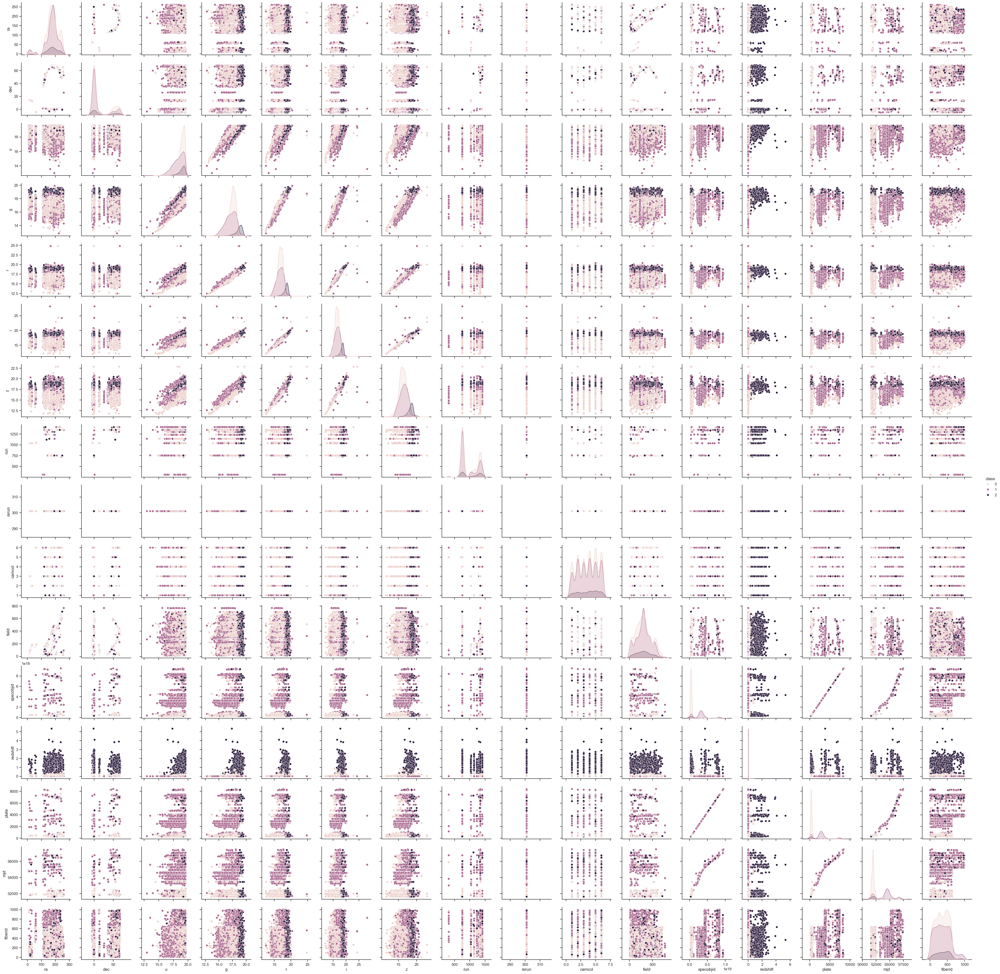

In [11]:
sns.set_theme(style="ticks") # Se estable el estilo del gráfico de pares.
sns.pairplot(df, hue="class"); # Se crea un gráfico de pares para visualizar la relación entre todas las variables del dataframe.

In [77]:
X = df.drop(["class"], axis=1) 
y = df['class']  

scaler = StandardScaler()

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, shuffle=True)

X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [568]:
# Define the model

def get_model():
    model = tf.keras.Sequential([  # Se crea un modelo secuencial de Keras.
        tf.keras.layers.InputLayer(shape=(len(X.columns),)), # Se establecen 16 entradas 
        
        tf.keras.layers.Dense(16),                  # Primera capa oculta con 16 neuronas, batch normalization y función de activación relu.
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Activation('relu'),
        
        tf.keras.layers.Dense(16),                  # Segunda capa oculta con 16 neuronas, batch normalization, función de activación relu y un Dropout del 20%.
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Activation('relu'),
        tf.keras.layers.Dropout(0.2),
        
        tf.keras.layers.Dense(3, activation='linear' ) # Capa de salida con 3 neuronas, (Clase 0, Clase 1, Clase 2).
    ])
    return model

model = get_model() # Se obtiene el modelo.

Para la estructura del modelo, se probó con 2 a 3 capas ocultas con diferentes cantidades de neuronas entre sí, obteniendo los mejores resultados con esta configuración. Asimismo, se optó por incluir Dropout en la última capa oculta, ya que puede capturar características relevantes. Finalmente, se decidió utilizar la función de activación 'linear' en la capa de salida. De acuerdo al profesor Andrew Ng de la Universidad de Stanford, una forma de implementar la función de activación 'softmax' de manera numéricamente más eficiente es incluir 'SparseCategoricalCrossentropy(from_logits=True)' en la función de pérdida, para después utilizar la función de activación 'linear' en la capa de salida.

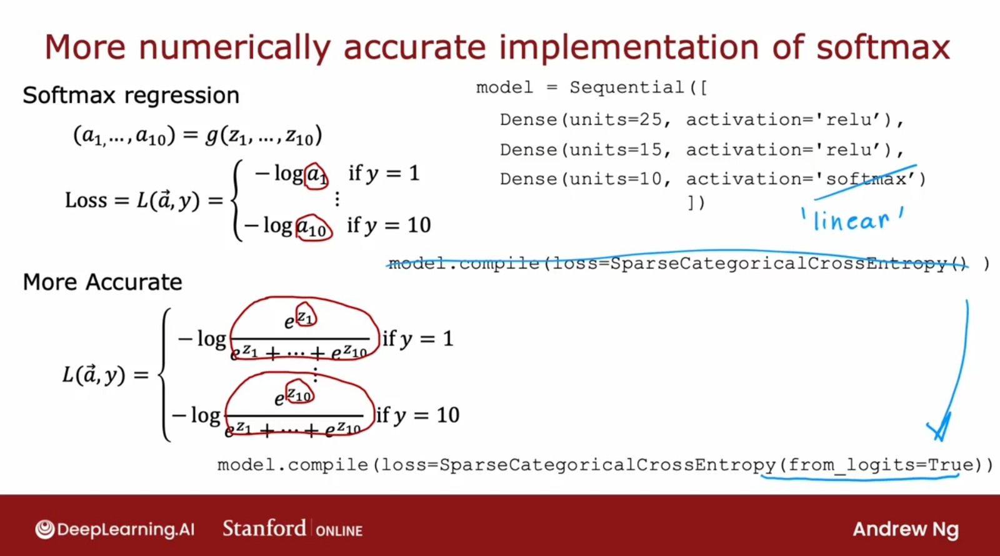

In [569]:
model.summary() # Se devuelve un análisis del modelo.

Model: "sequential_31"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_96 (Dense)                │ (None, 16)             │           272 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_65          │ (None, 16)             │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_65 (Activation)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_97 (Dense)                │ (None, 16)             │           272 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_66          │ (None, 16)             │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_66 (Activation)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_31 (Dropout)            │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_98 (Dense)                │ (None, 3)              │            51 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 723 (2.82 KB)

 Trainable params: 659 (2.57 KB)

 Non-trainable params: 64 (256.00 B)

Se obsera un resumen del modelo, donde hay un total de 723 parámetros, los cuales 659 son entrenables y el resto 64 no lo son, teniendo el modelo un peso total de 2.82 KB. Como se mencionó anteriormente, se hicieron pruebas con un mayor número de capas y neuronas entre estás, sin embargo, se optó por utilizar este modelo debido a que pesaba menos, algo a tener en cuenta al momento de querer importarlo a un sistema embebido.

In [570]:
loss_function = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)

from tensorflow.keras.optimizers import Adam


model.compile(optimizer = Adam(learning_rate=0.001), loss=loss_function, metrics=['accuracy'])

Se establece la función de pérdida SparseCategoricalCrossentropy, la más utilizada en clasificación multiclase, con lo anteriormente mencionado de from_logits=True, para hacerlo númericamente más estable.

In [571]:
from keras.callbacks import EarlyStopping

# Definir el callback de Early Stopping
early_stopping = EarlyStopping(
    patience= 10,
    monitor='val_loss',
    min_delta=0.001,
    restore_best_weights=True,
)

# Entrenar el modelo con el callback que minimiza el learning rate
history = model.fit(
    X_train, y_train,
    epochs=200,
    batch_size=32,
    validation_split=0.2,
    callbacks=[early_stopping]  # Añadir el callback de EarlyStopping scheduler
)

Epoch 1/200
200/200 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.5704 - loss: 1.0224 - val_accuracy: 0.8687 - val_loss: 0.4996
Epoch 2/200
200/200 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8528 - loss: 0.4667 - val_accuracy: 0.8950 - val_loss: 0.3216
Epoch 3/200
200/200 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8798 - loss: 0.3674 - val_accuracy: 0.9131 - val_loss: 0.2563
Epoch 4/200
200/200 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8781 - loss: 0.3213 - val_accuracy: 0.9187 - val_loss: 0.2197
Epoch 5/200
200/200 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.9089 - loss: 0.2737 - val_accuracy: 0.9400 - val_loss: 0.1927
Epoch 6/200
200/200 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.9135 - loss: 0.2563 - val_accuracy: 0.9463 - val_loss: 0.1696
Epoch 7/200
200/200 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.9311 - loss: 0.2221 - val_accuracy: 0.9556 - val_loss: 0.1518
Epoch 8/200
200/200 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.9433 - loss: 0.1910 - val_accu

La elección de un batch size de 32 se debe a que es un valor comúnmente utilizado en el entrenamiento de redes neuronales, ya que proporciona un buen balance entre eficiencia de cómputo y uso de memoria. Además, en este proyecto, la cantidad de datos es considerablemente mayor en comparación con el primer proyecto, lo que justifica un tamaño de batch más estándar para optimizar el rendimiento.

En la época 40, se alcanzó una precisión (accuracy) del 98.25% en los datos de validación, con una pérdida (loss) de 0.0771. La implementación de EarlyStopping permitió detener el entrenamiento de manera anticipada tras 10 épocas sin mejora, agilizando el proceso y evitando sobreentrenamiento, lo que resultó en un modelo eficiente sin desperdiciar recursos de por medio.

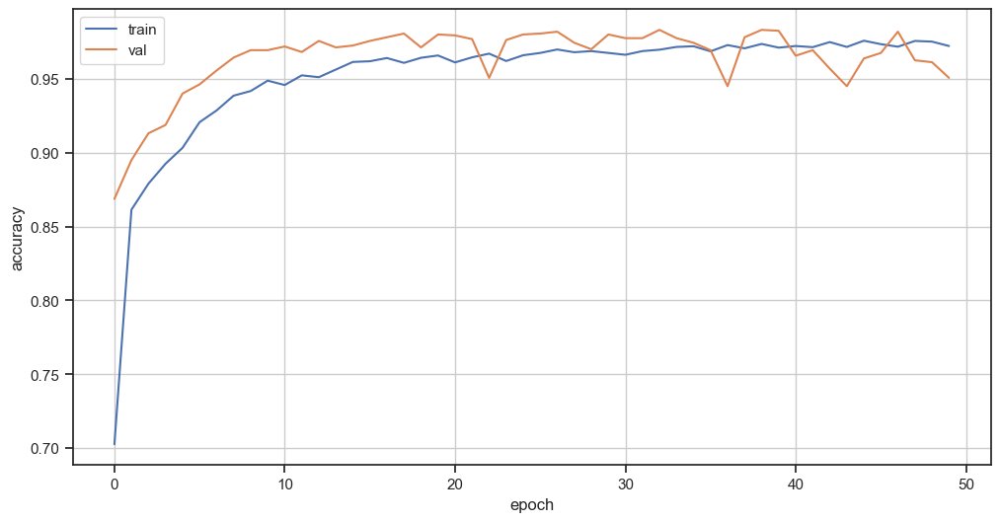

In [572]:
# Plot validation and testing accuracy
plt.figure(figsize=(12,6)) # Se establece el tamaño de la gráfica.
plt.plot(history.history['accuracy']) # Se gráfica la exactitud del modelo a través de las épocas.
plt.plot(history.history['val_accuracy']) # Se gráfica la exactitud del modelo con los datos de validación del entrenamiento a través de las épocas.
plt.xlabel('epoch') # El eje x corresponde a las épocas.
plt.ylabel('accuracy') # El eje y corresponde a las exactitud.
plt.legend(['train', 'val']) # Se añade una leyenda para distinguir entre entrenamiento y validación.
plt.grid(); # Se añade una cuadrícula a la gráfica para mejorar la legibilidad.

En esta gráfica se puede observar como la inclusión del EarlyStopping evita un sobreentrenamiento, donde en la época 47 se logró llegar a una precisión nuevamente del 98% con los datos de validación, sin embargo, con una pérdida un poco mayor (0.0856), con lo que se pudo evitar el sobreajuste, teniendo además buenos resultados. 

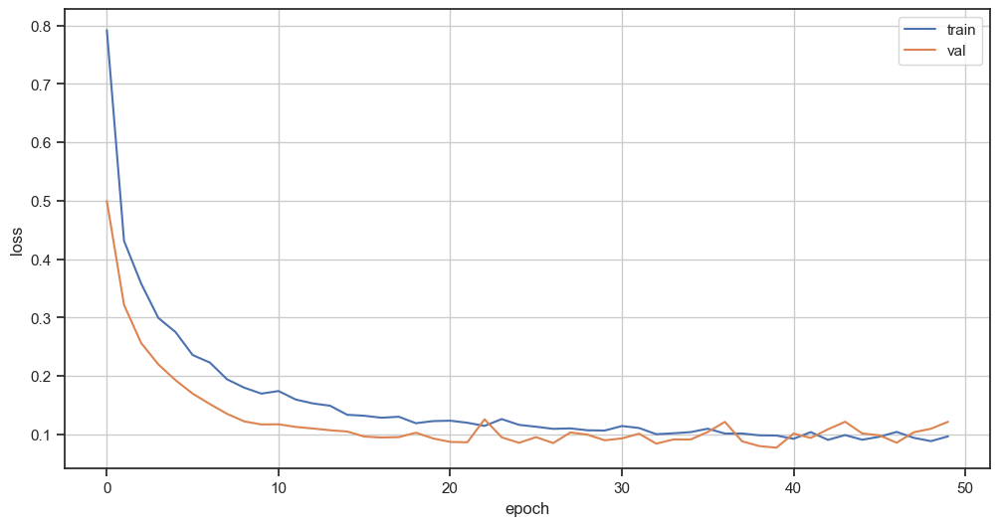

In [573]:
# Plot validation and testing loss
plt.figure(figsize=(12,6)) # Se establece el tamaño de la gráfica.
plt.plot(history.history['loss']) # Se gráfica la pérdida del conjunto de entrenamiento a lo largo de las épocas.
plt.plot(history.history['val_loss']) # Se gráfica la pérdida con los datos de validación del entrenamiento a lo largo de las épocas.
plt.xlabel('epoch') # El eje x corresponde a las épocas.
plt.ylabel('loss') # El eje y corresponde a la pérdida.
plt.legend(['train', 'val'])  # Se añade una leyenda para distinguir entre entrenamiento y validación.
plt.grid(); # Se añade una cuadrícula a la gráfica para mejorar la legibilidad.

In [574]:
# Print weights
weights = model.layers[0].get_weights() # Se muestran los pesos de las entradas.
print(weights) # Se muestran los pesos.

[array([[ 2.39541620e-01,  9.02470294e-03, -1.01611301e-01,
        -3.76316756e-02, -1.04356050e-01,  2.39700422e-01,
        -1.18298121e-01, -1.97986830e-02,  1.41042517e-02,
        -1.24625310e-01, -9.16841161e-03, -6.49407431e-02,
        -1.12516344e-01, -1.16611376e-01, -2.39530317e-02,
         1.25790432e-01],
       [ 1.15605988e-01,  3.59973274e-02, -4.16058395e-03,
        -2.51500010e-01,  1.67310178e-01,  7.48385563e-02,
         1.94398478e-01, -6.81505725e-02,  6.74960017e-02,
        -5.28591797e-02, -2.04188034e-01, -1.10711768e-01,
         3.37108463e-01,  1.38650224e-01, -4.97618318e-02,
        -7.63453990e-02],
       [ 1.64420694e-01,  4.76032756e-02,  2.24946029e-02,
         1.59951091e-01,  3.53581190e-01,  1.89426929e-01,
        -3.04940104e-01, -1.32595867e-01, -4.60206240e-01,
        -2.26346880e-01, -5.65403551e-02, -5.75483404e-02,
         2.03340963e-01, -1.11353464e-01, -3.06986511e-01,
         1.57156751e-01],
       [-3.90637547e-01,  1.97946563

63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


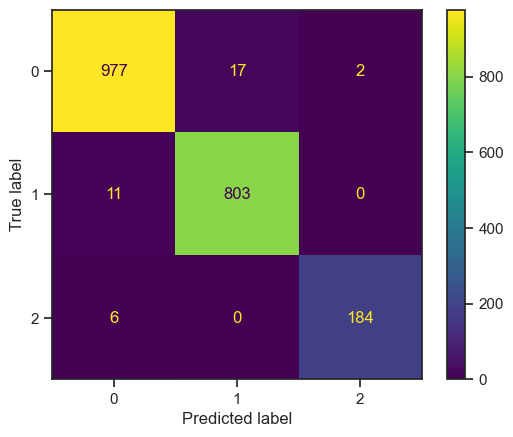

In [575]:
# Realizar las predicciones
y_probabilities = model.predict(X_test)

# Convertir las probabilidades en predicciones de clases (índices de la clase con la mayor probabilidad)
y_predictions = np.argmax(y_probabilities, axis=1)

# Calcular la matriz de confusión
c_matrix = confusion_matrix(y_true=y_test, y_pred=y_predictions)

# Mostrar la matriz de confusión
display_matrix = ConfusionMatrixDisplay(confusion_matrix=c_matrix)
display_matrix.plot() 

En los resultados obtenidos en la matriz de confusión con 2 mil datos de prueba, se observa como el modelo llegó a una precisión del 98.2% con los datos, teniendo una mayor de falsos negativos en la Clase 1 (Galaxias). 

In [576]:
# Evaluate the model on the test data
loss, accuracy = model.evaluate(X_test, y_test) # Se evalua el modelo con los datos de prueba.
print(f"Test Accuracy: {accuracy:.4f}") # Se muestra la precisión y la pérdida.

63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 639us/step - accuracy: 0.9802 - loss: 0.0869
Test Accuracy: 0.9820


In [577]:
print(classification_report(y_test, y_predictions))

              precision    recall  f1-score   support

           0       0.98      0.98      0.98       996
           1       0.98      0.99      0.98       814
           2       0.99      0.97      0.98       190

    accuracy                           0.98      2000
   macro avg       0.98      0.98      0.98      2000
weighted avg       0.98      0.98      0.98      2000



In [578]:
# Definir función para obtener métricas para cada clase en una matriz de confusión 3x3
def get_performance_metrics(c_matrix):
    # Inicializar listas para almacenar las métricas por clase
    accuracy_per_class = []
    precision_per_class = []
    recall_per_class = []
    specificity_per_class = []
    f1_score_per_class = []

    # Iterar sobre cada clase (diagonal de la matriz de confusión)
    for i in range(len(c_matrix)):
        # Verdaderos Positivos (TP)
        tp = c_matrix[i, i]

        # Falsos Positivos (FP) - Columna de la clase i sin el verdadero positivo
        fp = c_matrix[:, i].sum() - tp

        # Falsos Negativos (FN) - Fila de la clase i sin el verdadero positivo
        fn = c_matrix[i, :].sum() - tp

        # Verdaderos Negativos (TN) - Todo lo demás que no está en la fila o columna de la clase i
        tn = c_matrix.sum() - (tp + fp + fn)

        # Calcular las métricas para la clase i
        accuracy = (tp + tn) / c_matrix.sum()
        precision = tp / (tp + fp) if (tp + fp) != 0 else 0
        recall = tp / (tp + fn) if (tp + fn) != 0 else 0
        specificity = tn / (tn + fp) if (tn + fp) != 0 else 0
        f1 = 2 * (precision * recall) / (precision + recall) if (precision + recall) != 0 else 0

        # Almacenar las métricas para la clase
        accuracy_per_class.append(accuracy)
        precision_per_class.append(precision)
        recall_per_class.append(recall)
        specificity_per_class.append(specificity)
        f1_score_per_class.append(f1)

    return accuracy_per_class, precision_per_class, recall_per_class, specificity_per_class, f1_score_per_class

# Obtener métricas
accuracy_per_class, precision_per_class, recall_per_class, specificity_per_class, f1_score_per_class = get_performance_metrics(c_matrix)

# Mostrar resultados
for i in range(len(c_matrix)):
    print(f"\nClase {i}:")
    print(f"Accuracy: {accuracy_per_class[i]:0.6f}")
    print(f"Precision: {precision_per_class[i]:0.6f}")
    print(f"Recall: {recall_per_class[i]:0.6f}")
    print(f"Specificity: {specificity_per_class[i]:0.6f}")
    print(f"F1-score: {f1_score_per_class[i]:0.6f}")



Clase 0:
Accuracy: 0.982000
Precision: 0.982897
Recall: 0.980924
Specificity: 0.983068
F1-score: 0.981910

Clase 1:
Accuracy: 0.986000
Precision: 0.979268
Recall: 0.986486
Specificity: 0.985666
F1-score: 0.982864

Clase 2:
Accuracy: 0.996000
Precision: 0.989247
Recall: 0.968421
Specificity: 0.998895
F1-score: 0.978723


In [593]:
def check_and_create_directory(directory_path):
    """
    Checks if a directory exists, and if it does not, creates it.

    This function first checks whether the given directory path exists. 
    If the directory does not exist, it attempts to create it using `os.makedirs()`. 
    If the directory exists, it simply prints a message indicating so. 
    If there is an error during directory creation, the exception is caught and an error message is displayed.

    Args:
        directory_path (str): The path of the directory to check and create if not present.

    Returns:
        None
    """

    # Check if the directory already exists
    if not os.path.exists(directory_path):
        
        try:
            # Create the directory if it does not exist
            os.makedirs(directory_path)
            print(f"Directory '{directory_path}' created.")

        except OSError as error:
            print(f"Error creating directory: {error}")
    else:
        print(f"Directory '{directory_path}' already exists.")

In [597]:
# Create a directory to store the Keras model
check_and_create_directory('models')

# Build the Keras filename
prefix = datetime.now().strftime("%Y-%m-%d-%H-%M-%S-%f")[:-4]
filename = 'project-02-team-01.keras'
path_and_filename = "".join(['models/', prefix, '-', filename])

# Save the model
model.save(path_and_filename)

Directory 'models' already exists.


In [598]:
# Load the saved neural network model. Make sure this is similar to that one shown above
new_model = tf.keras.models.load_model(path_and_filename, custom_objects=None, compile=True, safe_mode=True)
new_model.summary()

Model: "sequential_31"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_96 (Dense)                │ (None, 16)             │           272 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_65          │ (None, 16)             │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_65 (Activation)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_97 (Dense)                │ (None, 16)             │           272 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_66          │ (None, 16)             │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_66 (Activation)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_31 (Dropout)            │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_98 (Dense)                │ (None, 3)              │            51 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,043 (7.98 KB)

 Trainable params: 659 (2.57 KB)

 Non-trainable params: 64 (256.00 B)

 Optimizer params: 1,320 (5.16 KB)

## Machine Learning

In [579]:
from sklearn.neighbors import KNeighborsClassifier
knnClassifier = KNeighborsClassifier(n_neighbors = 6, p=1)
model2 = knnClassifier.fit(X_train, y_train)
y_pred = model2.predict(X_test)

              precision    recall  f1-score   support

           0       0.87      0.96      0.91       996
           1       0.93      0.84      0.88       814
           2       0.97      0.81      0.89       190

    accuracy                           0.90      2000
   macro avg       0.92      0.87      0.89      2000
weighted avg       0.90      0.90      0.90      2000



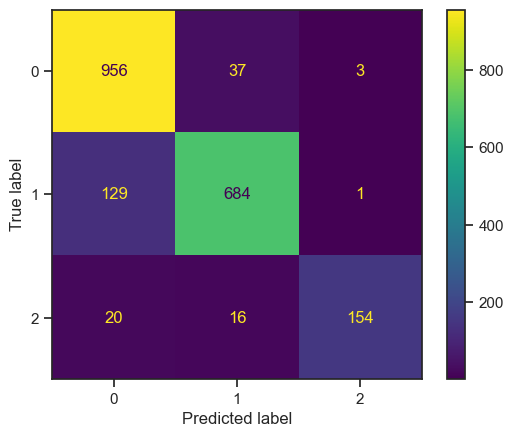

In [580]:
print(classification_report(y_test, y_pred))

c_matrix1 = confusion_matrix(y_true=y_test, y_pred=y_pred)

# Mostrar la matriz de confusión
display_matrix = ConfusionMatrixDisplay(confusion_matrix=c_matrix1)
display_matrix.plot()

In [581]:
# Obtener métricas
accuracy_per_class, precision_per_class, recall_per_class, specificity_per_class, f1_score_per_class = get_performance_metrics(c_matrix1)

# Mostrar resultados
for i in range(len(c_matrix1)):
    print(f"\nClase {i}:")
    print(f"Accuracy: {accuracy_per_class[i]:0.6f}")
    print(f"Precision: {precision_per_class[i]:0.6f}")
    print(f"Recall: {recall_per_class[i]:0.6f}")
    print(f"Specificity: {specificity_per_class[i]:0.6f}")
    print(f"F1-score: {f1_score_per_class[i]:0.6f}")



Clase 0:
Accuracy: 0.905500
Precision: 0.865158
Recall: 0.959839
Specificity: 0.851594
F1-score: 0.910043

Clase 1:
Accuracy: 0.908500
Precision: 0.928087
Recall: 0.840295
Specificity: 0.955312
F1-score: 0.882012

Clase 2:
Accuracy: 0.980000
Precision: 0.974684
Recall: 0.810526
Specificity: 0.997790
F1-score: 0.885057


In [582]:
from sklearn.svm import SVC
model3 = SVC(kernel='linear').fit(X_train, y_train)
y_pred2 = model3.predict(X_test)


              precision    recall  f1-score   support

           0       0.99      0.97      0.98       996
           1       0.97      0.99      0.98       814
           2       0.98      0.98      0.98       190

    accuracy                           0.98      2000
   macro avg       0.98      0.98      0.98      2000
weighted avg       0.98      0.98      0.98      2000



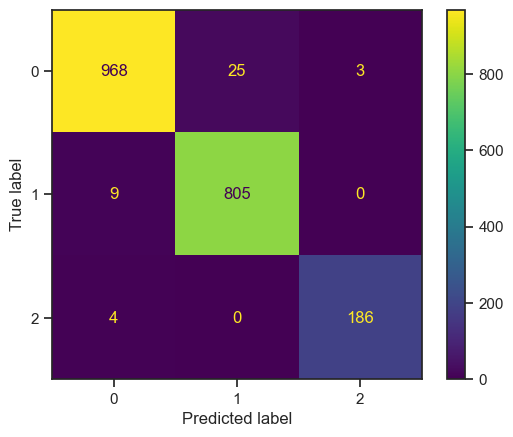

In [583]:
print(classification_report(y_test, y_pred2))

c_matrix2 = confusion_matrix(y_true=y_test, y_pred=y_pred2)

# Mostrar la matriz de confusión
display_matrix = ConfusionMatrixDisplay(confusion_matrix=c_matrix2)
display_matrix.plot()

In [584]:
# Obtener métricas
accuracy_per_class, precision_per_class, recall_per_class, specificity_per_class, f1_score_per_class = get_performance_metrics(c_matrix2)

# Mostrar resultados
for i in range(len(c_matrix2)):
    print(f"\nClase {i}:")
    print(f"Accuracy: {accuracy_per_class[i]:0.6f}")
    print(f"Precision: {precision_per_class[i]:0.6f}")
    print(f"Recall: {recall_per_class[i]:0.6f}")
    print(f"Specificity: {specificity_per_class[i]:0.6f}")
    print(f"F1-score: {f1_score_per_class[i]:0.6f}")


Clase 0:
Accuracy: 0.979500
Precision: 0.986748
Recall: 0.971888
Specificity: 0.987052
F1-score: 0.979262

Clase 1:
Accuracy: 0.983000
Precision: 0.969880
Recall: 0.988943
Specificity: 0.978921
F1-score: 0.979319

Clase 2:
Accuracy: 0.996500
Precision: 0.984127
Recall: 0.978947
Specificity: 0.998343
F1-score: 0.981530


# Referencias

- Sloan Digital Sky Survey DR14. (2018). Kaggle. https://www.kaggle.com/datasets/lucidlenn/sloan-digital-sky-survey/data
- My Course. (2024). [Advanced Learning Algorithms] 25.Improved implementation of softmax [Video]. YouTube. https://www.youtube.com/watch?v=iTa37-xf1_k 
- Scikit-learn. (n.d.). KNeighborsClassifier. Scikit-learn. https://scikit-learn.org/dev/modules/generated/sklearn.neighbors.KNeighborsClassifier.html
- Scikit-learn. (n.d.). 1.4. Support vector machines. https://scikit-learn.org/1.5/modules/svm.html
- Scikit-learn. (n.d.). SVC. https://scikit-learn.org/dev/modules/generated/sklearn.svm.SVC.html